# 2018/2019 - Task List 1

1. Generate random variable from prefered dystribution using Pyro (pyro.sample)
    
    - animate how distribution of values changes
    - animate histograms of values
    - start with empty list of values, generate new samples, generate histogram
    
    
2. Write a simulator (and exact solution utilizing Bayes theorem) for chances to be ill on a certain disease. We know that it affects from about 1 to 100 out of 50,000 people. There was developed a test to check whether the person has the disease and it is quite accurate: the probability that the test result is positive (suggesting the person has the disease), given that the person does not have the disease, is only 2 percent; the probability that the test result is negative (suggesting the person does not have the disease), given that the person has the disease, is only 1 percent. When a random person gets tested for the disease and the result comes back positive, what is the probability that the person has the disease? Check whole parameter space and visualise results.

    - it must be a simulator!
    - sample from distribution using given probabilities
    - repeate experiment and compare with Bayes equation


## Required imports

In [1]:
%matplotlib inline
import pyro
import torch
import numpy as np
import matplotlib.pyplot as plt

from matplotlib import animation, rc
from IPython.display import HTML

## Generating single value from normal distribution with given mean and variance

In [2]:
mean = 0
variance = 10
x = pyro.sample("normal_sampling", pyro.distributions.Normal(mean, variance))
print(x)

tensor(-3.5175)


## Sampling from categorical probabilities with given probabilities

In [7]:
x = pyro.sample("categorical_sampling", pyro.distributions.Categorical(logits = torch.tensor([0.5, 0.5])))
print(x)

tensor(0)


## Animating data

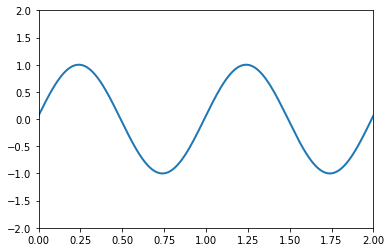

In [9]:
def animate():
    # First set up the figure, the axis, and the plot element we want to animate
    fig, ax = plt.subplots()

    ax.set_xlim(( 0, 2))
    ax.set_ylim((-2, 2))

    line, = ax.plot([], [], lw=2)
    
    # animation function. This is called sequentially
    def sin(i):
        x = np.linspace(0, 2, 1000)
        y = np.sin(2 * np.pi * (x - 0.01 * i))
        line.set_data(x, y)
        return (line,)

    # initialization function: plot the background of each frame
    def init():
        line.set_data([], [])
        return (line,)
    # call the animator. blit=True means only re-draw the parts that have changed.
    anim = animation.FuncAnimation(fig, sin, init_func=init,
                                   frames=100, interval=20, blit=True)
    return HTML(anim.to_jshtml())

animate()

## Drawing histogram

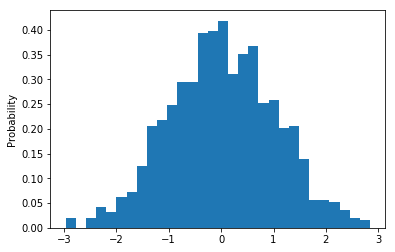

In [3]:
x = np.random.normal(size = 1000)
plt.hist(x, density=True, bins=30)
plt.ylabel('Probability');

## Task 1

Generate random variable from prefered dystribution using Pyro (pyro.sample)
- animate how distribution of values changes
- animate histograms of values
- start with empty list of values, generate new samples, generate histogram


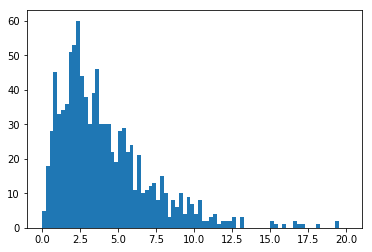

In [27]:
## Insert solution here
degrees_of_freedom = 4
number_of_iterations = 1000

def animate():
    value_l = [] 

    def iteration( _ ):
        plt.cla()
        value_l.append(pyro.sample( "chi2_sampling", pyro.distributions.Chi2(degrees_of_freedom)))
        plt.hist( value_l, 80 ,(0.0,20.0) )
    
    fig, ax = plt.subplots()
    
    anim = animation.FuncAnimation( fig, iteration, number_of_iterations, lambda : plt.cla() , interval=20 )
    return HTML(anim.to_jshtml())

animate()
    
        
    



## Task 2

Write a simulator (and exact solution utilizing Bayes theorem) for chances to be ill on a certain disease. We know that it affects from about 1 to 100 out of 50,000 people. There was developed a test to check whether the person has the disease and it is quite accurate: the probability that the test result is positive (suggesting the person has the disease), given that the person does not have the disease, is only 2 percent; the probability that the test result is negative (suggesting the person does not have the disease), given that the person has the disease, is only 1 percent. When a random person gets tested for the disease and the result comes back positive, what is the probability that the person has the disease? Check whole parameter space and visualise results.
- it must be a simulator!
- sample from distribution using given probabilities
- repeate experiment and compare with Bayes equation


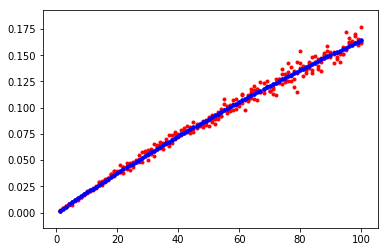

In [112]:
## Insert solution here
REPEAT = 3
POPULATION_SIZE = 50_000
POSITIVE_RANGE = (1,101)

# Positive - ill test

false_positive = 0.02
false_negative = 0.01

true_positive = 1 - false_positive
true_negatie = 1 - false_negative


#POSITIVE => abs(x) == 2
#NEGATIVE => abs(x) == 1

#TRUE => x > 0
#FALSE => x < 0
#(0=false,1=null,2=true)
positive_distribution = pyro.distributions.Categorical(probs=torch.tensor([false_positive,true_positive]))
negative_distribution = pyro.distributions.Categorical(probs=torch.tensor([false_negative,true_negatie]))

def generate_populaion( population_size, positive_subjects_size):
    negative_subjects_size = population_size - positive_subjects_size
    return np.append( np.ones((1,positive_subjects_size)), np.zeros((1,negative_subjects_size)) ) + 1

def test_subject( is_positive ):
    if is_positive:
        return pyro.sample( "positive_sampling",positive_distribution)
    else:
        return pyro.sample( "negative_sampling",negative_distribution)
                        
def test_subjects(subjects):
    is_positive = subjects - 1
    v_test_subject = np.vectorize( test_subject )
    is_true = v_test_subject( is_positive )
    return subjects * ( is_true * 2 - 1 )



def process_simulation_step( population_size, positive_subjects_size ):
    x = generate_populaion(population, positive_subjects_size)
    y = test_subjects( x )
    return y


def bayes_true_positive( subject_number, positive):
    prob_pos = positive/subject_number
    prob_neg = 1 - prob_pos 
    return prob_pos * true_positive / ( prob_pos * true_positive + prob_neg * false_negative  )

def simulation( repeat, population_size, positive_range ):
    sim_result = []
    for ill_subjects in range(positive_range[0],positive_range[1] ):
        for _ in range( repeat ):
            sim_result.append( (ill_subjects, process_simulation_step( population_size, ill_subjects ),bayes_true_positive(population_size,ill_subjects)))
    return sim_result




def run():
    sim_result = simulation ( REPEAT, POPULATION_SIZE, POSITIVE_RANGE )
    plt.scatter([x for (x,y,z) in sim_result],\
        [np.count_nonzero( y==2 )/(np.count_nonzero( y==2 )+np.count_nonzero( y==-1 )) for (x,y,z) in sim_result],\
        marker='.', color='red', label='Sim')
    
    plt.scatter([x for (x,y,z) in sim_result],\
        [z for (x,y,z) in sim_result],\
        marker='.', color='blue', label='Sim')
    return
   
    
def info( subjects ):
    unique, counts = np.unique(subjects, return_counts=True)
    return dict(zip(unique, counts))



run()
    

